# Basic Usage

The FireANTs library relies on robust packages like `SimpleITK` and `nibabel` to load images, thereby supporting a lot of image formats. Let's start by importing the packages. 

In [30]:
%load_ext autoreload
%autoreload 2
from fireants.io import Image, BatchedImages
from fireants.registration.affine import AffineRegistration
from fireants.registration.greedy import GreedyRegistration
from fireants.registration.moments import MomentsRegistration
import matplotlib.pyplot as plt
import SimpleITK as sitk
from time import time
from pathlib import Path
import json



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
import torch
import numpy as np


# Step 1 : Winsorizing the image

When I visualized the images, I noticed that the contrast of the fixed image was much lower than that of the moving image. Therefore, I winsorized the images to clip the extreme values to between the 1st and 99th percentiles. This improves visualization and registration.

I will probably add this as a preprocessing step in the `Image` class, so that the user doesn't have to do it manually (an example of how its done manually below).

In [3]:
def winsorize(image: Image, lower:int=1, upper:int=99):
    imagenp = image.array.cpu().numpy()
    lower_val = np.percentile(imagenp, lower)
    upper_val = np.percentile(imagenp, upper)
    imagenp = np.clip(imagenp, lower_val, upper_val)
    imagenp = (imagenp - lower_val) / (upper_val - lower_val)
    image.array = torch.from_numpy(imagenp).to(image.array.device)
    return image
    


In [ ]:
# Update these paths to point to the desired input stacks and output directory
FIXED_PATH = Path('/mnt/nas_jlarsch/johannes/testIn/average_2p_noRot_flip_8b.nrrd')
MOVING_PATH = Path('/mnt/nas_jlarsch/johannes/testIn/L395_f10_anatomy_00002_8b.nrrd')
OUTPUT_DIR = Path('/mnt/nas_jlarsch/Johannes/testOutput/fireants/momentsMinimal2').resolve()
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)



In [ ]:

# load the images
movingimage = Image.load_file(MOVING_PATH)
fixedimage = Image.load_file(FIXED_PATH)
movingimage = winsorize(movingimage)
fixedimage = winsorize(fixedimage)

# batchify them (we only have a single image per batch, but we can pass multiple images)
moving_batch = BatchedImages([movingimage])
fixed_batch = BatchedImages([fixedimage])

#### Checking the origin and spacing of the images. Since the images vary greatly in the width of the axial dimension, we need to align the centers of the images rather than the origins. 

In [7]:
print(movingimage.itk_image.GetSpacing(), fixedimage.itk_image.GetSpacing())

(1.048361882567406, 1.048361882567406, 1.0) (1.0484, 1.0484, 1.0)


In [8]:
print(movingimage.itk_image.GetOrigin(), fixedimage.itk_image.GetOrigin())

(0.0, 0.0, 0.0) (0.0, 0.0, 0.0)


(-0.5, 511.5, -0.5, 182.5)

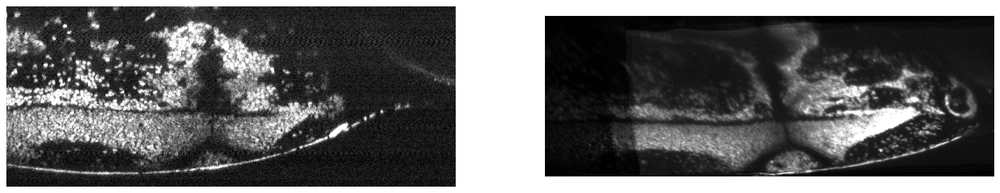

In [9]:
# visualize the images
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(moving_batch()[0, 0, :, :, moving_batch.shape[4]//2].cpu().numpy(), 'gray'); ax[0].invert_yaxis(); ax[0].axis('off')
ax[1].imshow(fixed_batch()[0, 0, :, :, fixed_batch.shape[4]//2].cpu().numpy(), 'gray'); ax[1].invert_yaxis(); ax[1].axis('off')

(-0.5, 511.5, -0.5, 182.5)

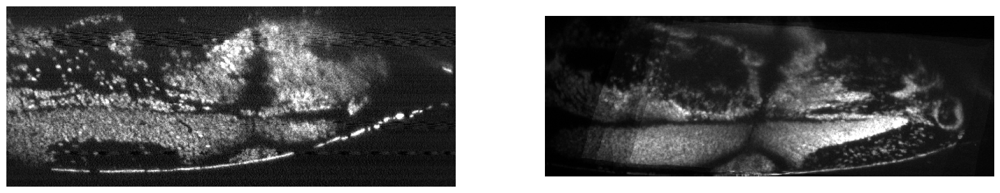

In [10]:
# visualize the images
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(moving_batch()[0, 0, :, moving_batch.shape[3]//2].cpu().numpy(), 'gray'); ax[0].invert_yaxis(); ax[0].axis('off')
ax[1].imshow(fixed_batch()[0, 0, :, fixed_batch.shape[3]//2].cpu().numpy(), 'gray'); ax[1].invert_yaxis(); ax[1].axis('off')

In [11]:
# test moment registration just in case
reg = MomentsRegistration(scale=4, fixed_images=fixed_batch, moving_images=moving_batch)
reg.optimize()
print(reg.get_affine_init())


INFO:fireants.registration.abstract:Registration of type MomentsRegistration initialized with dtype torch.float32


tensor([[[  1.0000,   0.0000,   0.0000, -25.1203],
         [  0.0000,   1.0000,   0.0000, -69.7550],
         [  0.0000,   0.0000,   1.0000,  26.4330]]], device='cuda:0')


<h4>Note that the result above says that the moving image center needs to be shifted by (-25, -69, 26) physical units (or similar units in voxels since the spacing is close to 1). This is probably the main reason why your initial alignment was not good enough. This is a large shift, and is probably why the registration failed.</h4>

*Note*: If your images differ in size, and you want the 'image centers' to be aligned before doing any registration, you have to perform this step first. By default, FireANTs (and ANTs too I think) will start with aligning the origins of the images.

In [12]:
# write some plotting scripts
# visualize the images
def plot_ax1(moved, offset):
    fig, ax = plt.subplots(1, 3, figsize=(21, 7))
    ax[0].imshow(fixed_batch()[0, 0, :, :, offset+fixed_batch.shape[4]//2].cpu().numpy(), 'gray'); ax[0].invert_yaxis(); ax[0].axis('off')
    ax[1].imshow(moved[0, 0, :, :, offset+fixed_batch.shape[4]//2].detach().cpu().numpy(), 'gray'); ax[1].invert_yaxis(); ax[1].axis('off')
    ax[2].imshow(moving_batch()[0, 0, :, :, offset+moving_batch.shape[4]//2].cpu().numpy(), 'gray'); ax[2].invert_yaxis(); ax[2].axis('off')
    # set titles
    ax[0].set_title("Fixed Image", fontsize=20)
    ax[1].set_title("Moved Image", fontsize=20)
    ax[2].set_title("Moving Image", fontsize=20)

In [13]:
def plot_ax2(moved, offset):
    fig, ax = plt.subplots(1, 3, figsize=(21, 7))
    ax[0].imshow(fixed_batch()[0, 0, fixed_batch.shape[2]//2 + offset].cpu().numpy(), 'gray'); ax[0].invert_yaxis(); ax[0].axis('off')
    ax[1].imshow(moved[0, 0, fixed_batch.shape[2]//2 + offset].detach().cpu().numpy(), 'gray'); ax[1].invert_yaxis(); ax[1].axis('off')
    ax[2].imshow(moving_batch()[0, 0, moving_batch.shape[2]//2 + offset].cpu().numpy(), 'gray'); ax[2].invert_yaxis(); ax[2].axis('off')
    # set titles
    ax[0].set_title("Fixed Image", fontsize=20)
    ax[1].set_title("Moved Image", fontsize=20)
    ax[2].set_title("Moving Image", fontsize=20)

### Now let's do some registration

In [14]:
# specify some values
scales = [12, 8, 4, 2, 1]  # scales at which to perform registration
iterations = [200, 200, 200, 100, 50]
optim = 'Adam'
lr = 3e-3

# create affine registration object
affine = AffineRegistration(scales, 
                            iterations, 
                            fixed_batch, moving_batch, 
                            loss_type='fusedcc',
                            optimizer=optim, optimizer_lr=lr,
                            init_rigid=reg.get_affine_init(),
                            cc_kernel_size=5)

INFO:fireants.registration.abstract:Setting iterations for loss function
INFO:fireants.registration.abstract:Setting scales for loss function
INFO:fireants.registration.abstract:Registration of type AffineRegistration initialized with dtype torch.float32


In [15]:
# run registration
start = time()
affine.optimize()
end = time()

scale: 1, iter: 8/50, loss: -0.048389:  18%|█▊        | 9/50 [00:01<00:08,  5.05it/s]


In [16]:
print("Runtime", end - start, "seconds")

Runtime 3.945908784866333 seconds


In [17]:
moved = affine.evaluate(fixed_batch, moving_batch)

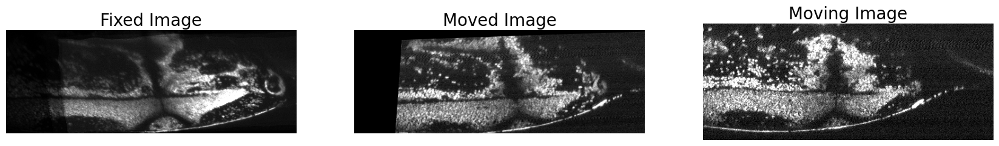

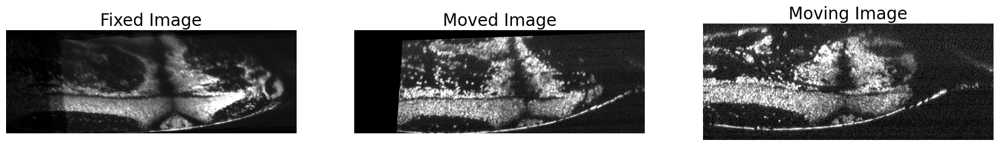

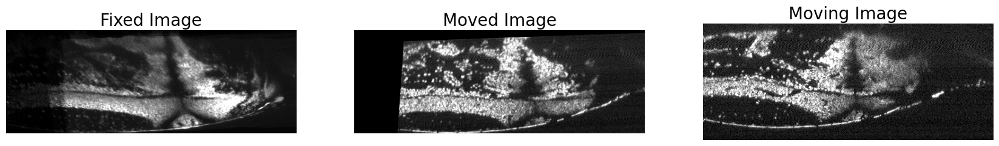

In [18]:
plot_ax1(moved, 0)
plot_ax1(moved, 20)
plot_ax1(moved, 40)

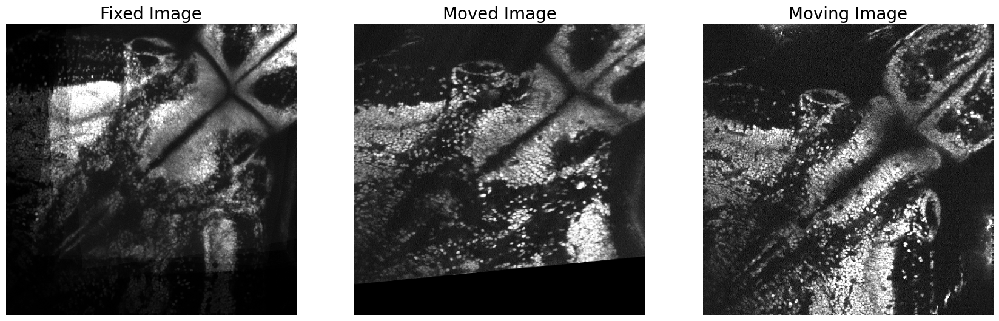

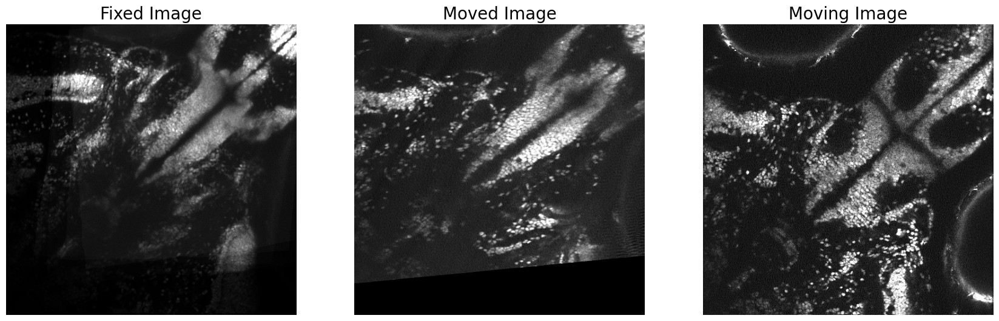

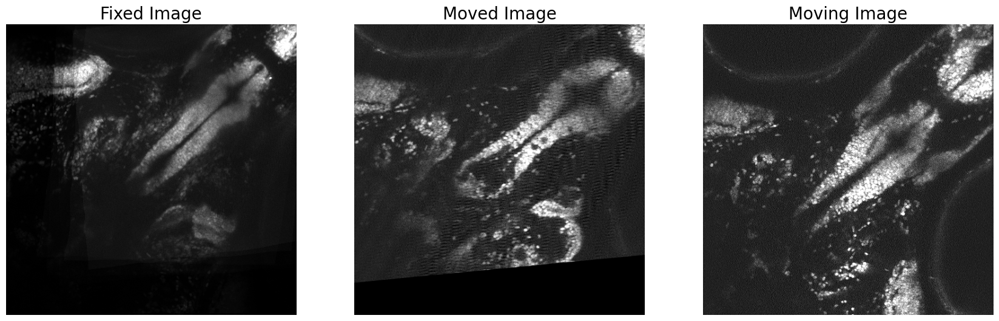

In [19]:
plot_ax2(moved, 0)
plot_ax2(moved, 20)
plot_ax2(moved, 40)

# Let's run deformable registration

The affine transform aligned the moving image to overlap more with the fixed image, but there wasn't much to align in the first place. Therefore, only the anterior portion of the skull seems a little deformed.

Let's run deformable registration and see the difference.

In [32]:
reg = GreedyRegistration(scales=[12, 8, 4, 2, 1], iterations=[200, 200, 200, 100, 25], 
            fixed_images=fixed_batch, moving_images=moving_batch,
            cc_kernel_size=31, deformation_type='compositive', 
            loss_type='fusedcc',
            smooth_warp_sigma = 3,
            smooth_grad_sigma=5, 
            optimizer='adam', optimizer_lr=0.5, init_affine=affine.get_affine_matrix().detach())

INFO:fireants.registration.abstract:Setting iterations for loss function
INFO:fireants.registration.abstract:Setting scales for loss function
INFO:fireants.registration.abstract:Setting scales for loss function
INFO:fireants.registration.abstract:Registration of type GreedyRegistration initialized with dtype torch.float32
INFO:fireants.registration.abstract:Registration of type GreedyRegistration initialized with dtype torch.float32


In [33]:
start = time()
reg.optimize()
end = time()

scale: 8, iter: 10/200, loss: -0.679539:   5%|▌         | 10/200 [00:00<00:01, 118.37it/s]

scale: 1, iter: 24/25, loss: -0.214097: 100%|██████████| 25/25 [00:20<00:00,  1.21it/s]


In [34]:
print("Runtime", end - start, "seconds")

Runtime 26.07178807258606 seconds


In [35]:
# get moved image
moved = reg.evaluate(fixed_batch, moving_batch)

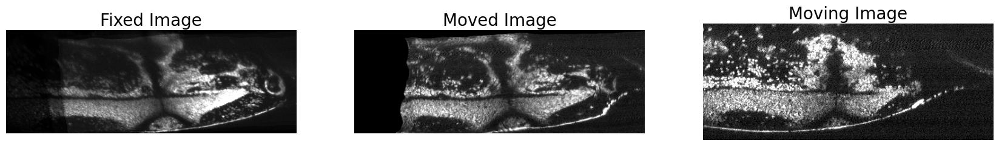

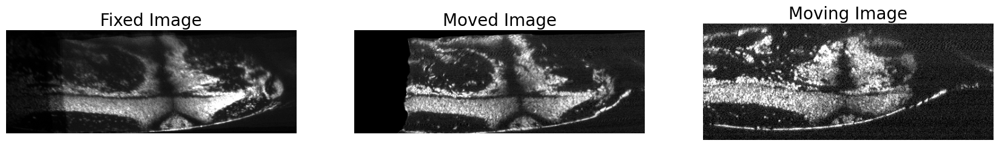

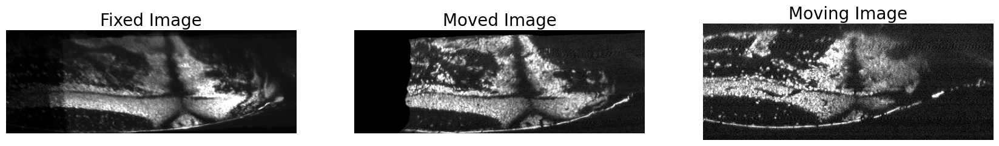

In [24]:
plot_ax1(moved, 0)
plot_ax1(moved, 20)
plot_ax1(moved, 40)

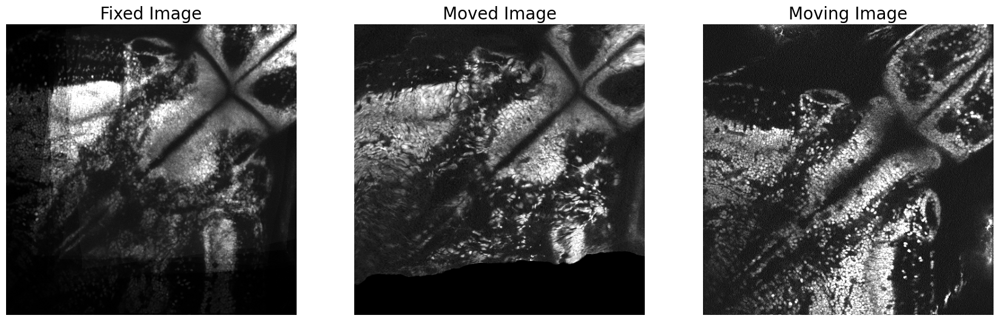

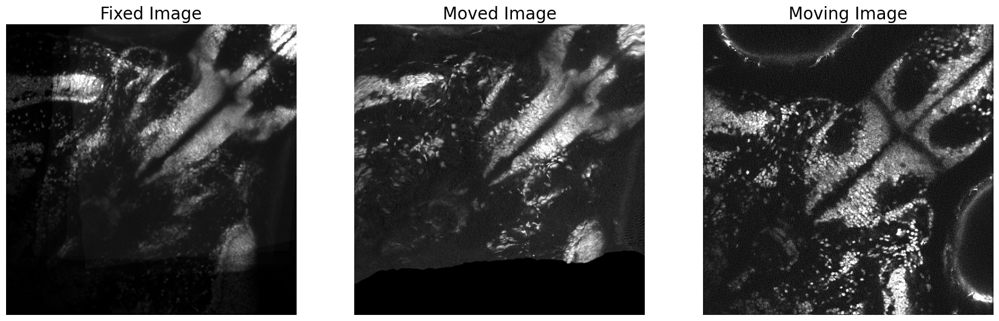

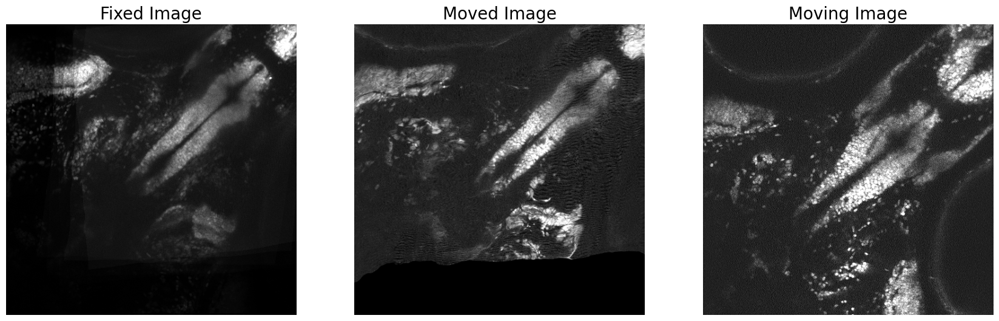

In [25]:
plot_ax2(moved, 0)
plot_ax2(moved, 20)
plot_ax2(moved, 40)

# More notes on hyperparameter selection

1. Since the images and deformations are large, I use scales of [12, 8, 4, 2, 1] instead of the default [4, 2, 1] used for in-vivo brain images.

2. You can choose whatever number of iterations you want. I just use 200 for the larger scales (more downsampled versions) and somewhere from 20-50 for the smaller scales (less downsampled versions).

3. I used `loss_type='fusedcc'` which is a more optimized cross-correlation kernel written in CUDA C++. 

4. Choosing `cc_kernel_size`:
    - For greedy registration, I used `cc_kernel_size=15`. Think of this parameter as a window size for the features you want to match. If you want to match tinier features, you can use a window size of 5 or 7. If you want to match larger features, you can use a window size of 15 or 21. Here I noticed that structures were relatively large, so I used a window size of 15.

    - For affine registration, I used `cc_kernel_size=5` because affine transformations are sparse and you can get away with a smaller window size (which is also faster). I tried `cc_kernel_size=15` but it didn't make much of a difference. But since I'm unfamiliar with the domain, my conclusion may be inaccurate. Please let me know what you think.

# Visualize difference image

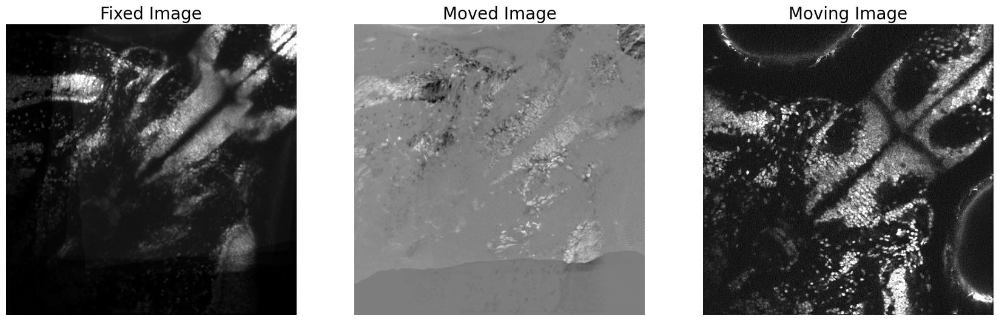

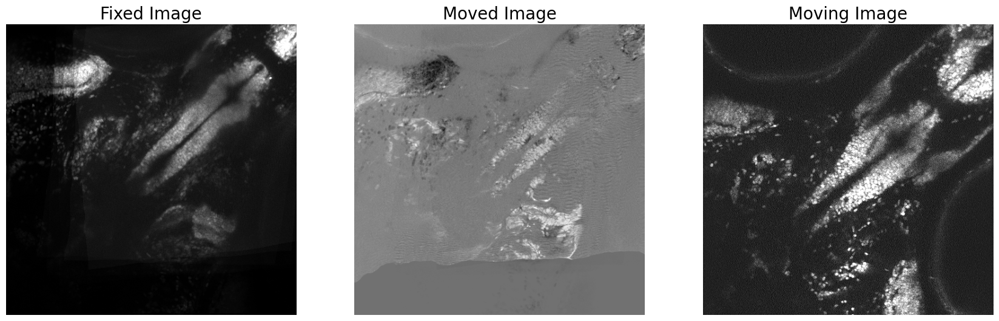

In [26]:
plot_ax2(moved - fixed_batch(), 20)
plot_ax2(moved - fixed_batch(), 40)

## Save registration outputs
Persist the affine-only and final deformable results along with transform metadata for downstream inspection.

In [36]:
def tensor_to_sitk(tensor, reference_image):
    array = tensor.squeeze().detach().cpu().numpy().astype(np.float32)
    image = sitk.GetImageFromArray(array)
    image.SetSpacing(reference_image.GetSpacing())
    image.SetOrigin(reference_image.GetOrigin())
    image.SetDirection(reference_image.GetDirection())
    return image

affine_tensor = affine.evaluate(fixed_batch, moving_batch)
deformable_tensor = reg.evaluate(fixed_batch, moving_batch)

affine_image_path = OUTPUT_DIR / 'moving_affine_only.nrrd'
deformable_image_path = OUTPUT_DIR / 'moving_affine_greedy.nrrd'
affine_image = tensor_to_sitk(affine_tensor, fixedimage.itk_image)
deformable_image = tensor_to_sitk(deformable_tensor, fixedimage.itk_image)
sitk.WriteImage(affine_image, str(affine_image_path))
sitk.WriteImage(deformable_image, str(deformable_image_path))

affine_transform_path = OUTPUT_DIR / 'affine_transform.mat'
try:
    affine.save_as_ants_transforms(str(affine_transform_path))
except AttributeError:
    np.save(OUTPUT_DIR / 'affine_matrix.npy', affine.get_affine_matrix().detach().cpu().numpy())
    affine_transform_path = OUTPUT_DIR / 'affine_matrix.npy'

greedy_transform_path = OUTPUT_DIR / 'greedy_transformWarp.nii.gz'
greedy_transform_saved = False
try:
    reg.save_as_ants_transforms(str(greedy_transform_path))
    greedy_transform_saved = True
except AttributeError:
    pass

summary_data = {
    'fixed_path': str(FIXED_PATH),
    'moving_path': str(MOVING_PATH),
    'affine_result_path': str(affine_image_path),
    'deformable_result_path': str(deformable_image_path),
    'affine_transform_path': str(affine_transform_path),
    'greedy_transform_path': str(greedy_transform_path) if greedy_transform_saved else None,
}
summary_path = OUTPUT_DIR / 'registration_summary.json'
with summary_path.open('w', encoding='utf-8') as f:
    json.dump(summary_data, f, indent=2)

print(f'Saved affine-aligned volume -> {affine_image_path}')
print(f'Saved deformable-aligned volume -> {deformable_image_path}')
print(f'Saved registration summary -> {summary_path}')
if greedy_transform_saved:
    print(f'Saved greedy transform displacement field -> {greedy_transform_path}')
else:
    print('Greedy transform export not supported for this registration object.')

INFO:fireants.registration.affine:Saved transform to /mnt/nas_jlarsch/Johannes/testOutput/fireants/momentsMinimal/affine_transform.mat


Saved affine-aligned volume -> /mnt/nas_jlarsch/Johannes/testOutput/fireants/momentsMinimal/moving_affine_only.nrrd
Saved deformable-aligned volume -> /mnt/nas_jlarsch/Johannes/testOutput/fireants/momentsMinimal/moving_affine_greedy.nrrd
Saved registration summary -> /mnt/nas_jlarsch/Johannes/testOutput/fireants/momentsMinimal/registration_summary.json
Saved greedy transform displacement field -> /mnt/nas_jlarsch/Johannes/testOutput/fireants/momentsMinimal/greedy_transformWarp.nii.gz
